<a href="https://colab.research.google.com/github/Arnav-Soney/ADAS/blob/main/ADAS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Shortest Path**

In [ ]:
!pip install osmnx
!pip install networkx
!pip install matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.2/100.2 kB 8.6 MB/s eta 0:00:00


In [ ]:
!pip install pyamaze

  Preparing metadata (setup.py) ... done
  Created wheel for pyamaze: filename=pyamaze-1.0.1-py3-none-any.whl size=9761 sha256=838b68658cdf95c22d21751cf97a47f18873db1a9707da58fc4c467cdbe04fd1
  Stored in directory: /root/.cache/pip/wheels/76/14/82/90f5b44b567d7f63407e667dd0d364c95e001c89644648ac47
Successfully built pyamaze


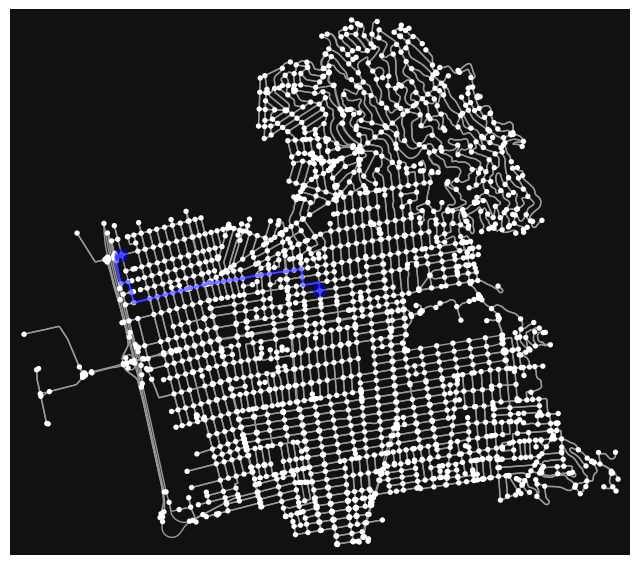

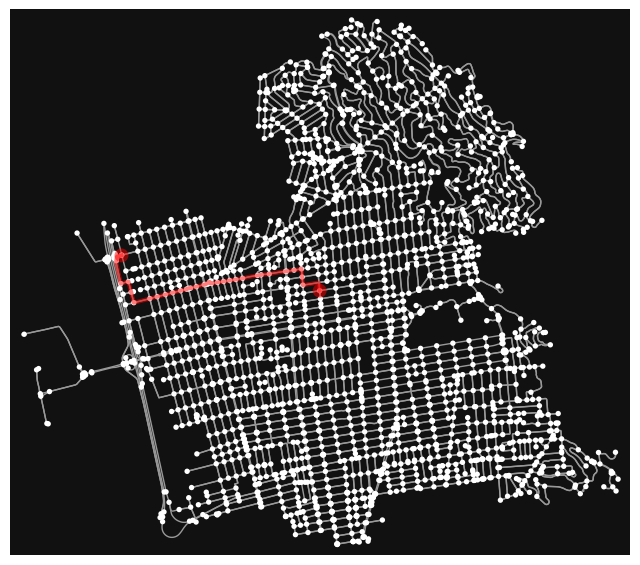

In [ ]:
import osmnx as ox
import networkx as nx

# Fixed Dijkstra function
def dijkstra(start, goal, graph):
    unvisited = {n: float('inf') for n in graph.nodes()}
    unvisited[start] = 0
    visited = {}
    predecessors = {}

    while unvisited:
        minNode = min(unvisited, key=unvisited.get)
        current_dist = unvisited[minNode]

        if minNode == goal:
            break

        for neighbor in graph.neighbors(minNode):
            if neighbor in visited:
                continue

            # Handle MultiGraph case
            if graph.is_multigraph():
                lengths = [
                    data['length']
                    for key, data in graph[minNode][neighbor].items()
                    if 'length' in data
                ]
                if not lengths:
                    continue
                min_length = min(lengths)
            else:
                # Single edge case
                if 'length' not in graph[minNode][neighbor]:
                    continue
                min_length = graph[minNode][neighbor]['length']

            tempDist = current_dist + min_length
            if tempDist < unvisited[neighbor]:
                unvisited[neighbor] = tempDist
                predecessors[neighbor] = minNode

        visited[minNode] = current_dist
        unvisited.pop(minNode)

    # Build path from predecessors
    shortest_path = [goal]
    node = goal
    while node != start:
        node = predecessors[node]
        shortest_path.append(node)
    shortest_path.reverse()

    return shortest_path


# Load the map graph from OpenStreetMap
place_name = "Berkeley, California"
map_graph = ox.graph_from_place(place_name, network_type='drive')

# Define start and end locations
origin_point = (37.8743, -122.277)
origin = ox.distance.nearest_nodes(map_graph, origin_point[1], origin_point[0])

# Pick the last node as destination just for demo
destination = list(map_graph.nodes())[-1]

# NetworkX built-in shortest path
shortest_path = nx.shortest_path(map_graph, origin, destination, weight='length')
fig, ax = ox.plot_graph_route(map_graph, shortest_path, route_color='blue', route_linewidth=3)

# Custom Dijkstra path
path_nodes = dijkstra(origin, destination, map_graph)
fig, ax = ox.plot_graph_route(map_graph, path_nodes, route_color='red', route_linewidth=3)


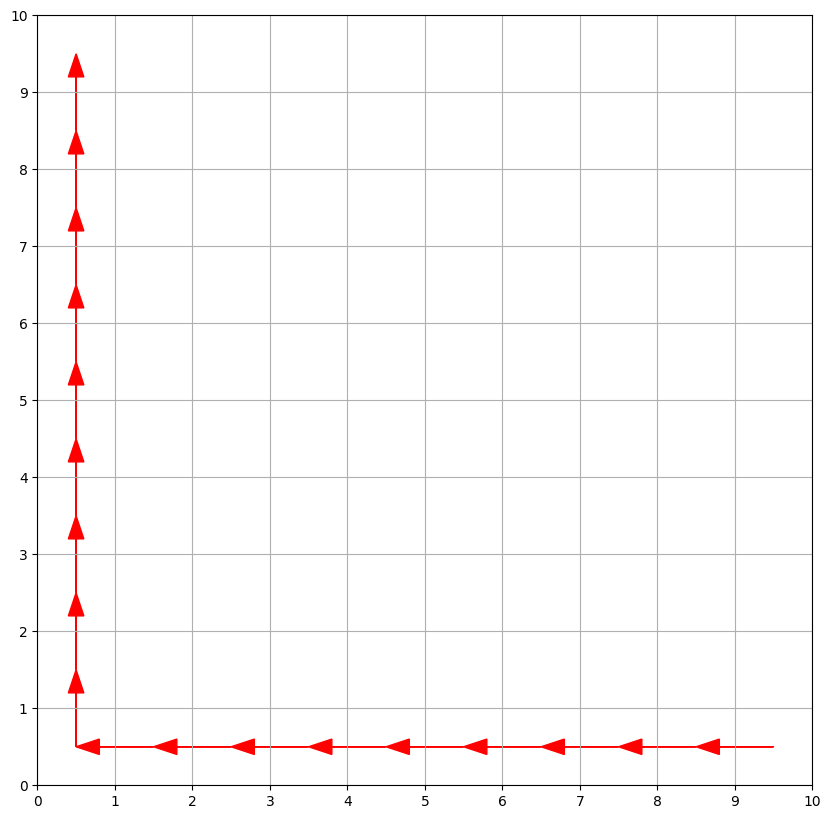

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def heuristic(cell1, cell2):
    x1, y1 = cell1
    x2, y2 = cell2
    return abs(x1 - x2) + abs(y1 - y2)

def get_minindex(x):
    f = []
    h = []
    for cell in x:
        f.append(cell[0])
        h.append(cell[1])
    mini = min(f)
    minindex = f.index(mini)
    f = np.array(f)
    indices = (np.where(f == mini)[0])
    if len(indices) != 1:
        mini = h[indices[0]]
        for i in range(1, len(indices)):
            if h[indices[i]] < mini:
                mini = h[indices[i]]
                minindex = indices[i]
    return minindex

def create_dummy_maze(rows, cols):
    maze_map = {}
    for i in range(1, rows+1):
        for j in range(1, cols+1):
            maze_map[(i, j)] = {'E': True if j < cols else False,
                                'W': True if j > 1 else False,
                                'N': True if i > 1 else False,
                                'S': True if i < rows else False}
    return maze_map

def astar(maze_map, start, goal, rows, cols):
    gscore = {cell: float('inf') for cell in maze_map}
    fscore = {cell: float('inf') for cell in maze_map}
    apath = {}

    gscore[start] = 0
    fscore[start] = heuristic(start, goal)

    openp = [(fscore[start], heuristic(start, goal), start)]
    minindex = 0

    while True:
        currentcell = openp[minindex][2]
        if currentcell == goal:
            break

        for d in 'EWSN':
            if maze_map[currentcell][d]:
                if d == 'E':
                    childcell = (currentcell[0], currentcell[1] + 1)
                if d == 'W':
                    childcell = (currentcell[0], currentcell[1] - 1)
                if d == 'S':
                    childcell = (currentcell[0] + 1, currentcell[1])
                if d == 'N':
                    childcell = (currentcell[0] - 1, currentcell[1])

                temp_gscore = gscore[currentcell] + 1
                temp_fscore = temp_gscore + heuristic(childcell, goal)

                if temp_fscore < fscore[childcell]:
                    gscore[childcell] = temp_gscore
                    fscore[childcell] = temp_fscore
                    openp.append((fscore[childcell], heuristic(childcell, goal), childcell))
                    apath[childcell] = currentcell

        openp.pop(minindex)
        if not openp:
            break
        minindex = get_minindex(openp)

    return apath

def forward_path(path, start, goal):
    cell = goal
    fwdpath = {}
    while cell != start:
        fwdpath[path[cell]] = cell
        cell = path[cell]
    return fwdpath

def draw_maze(rows, cols, path=None):
    fig, ax = plt.subplots(figsize=(cols, rows))
    ax.set_xlim(0, cols)
    ax.set_ylim(0, rows)
    ax.set_xticks(range(cols+1))
    ax.set_yticks(range(rows+1))
    ax.grid(True)

    if path:
        for k, v in path.items():
            y1, x1 = rows - k[0] + 0.5, k[1] - 0.5
            y2, x2 = rows - v[0] + 0.5, v[1] - 0.5
            ax.arrow(x1, y1, x2 - x1, y2 - y1,
                     head_width=0.2, length_includes_head=True, color='red')

    plt.show()

# Run the logic
rows, cols = 10, 10
maze_map = create_dummy_maze(rows, cols)
start, goal = (rows, cols), (1, 1)

path = astar(maze_map, start, goal, rows, cols)
fwdpath = forward_path(path, start, goal)

draw_maze(rows, cols, fwdpath)


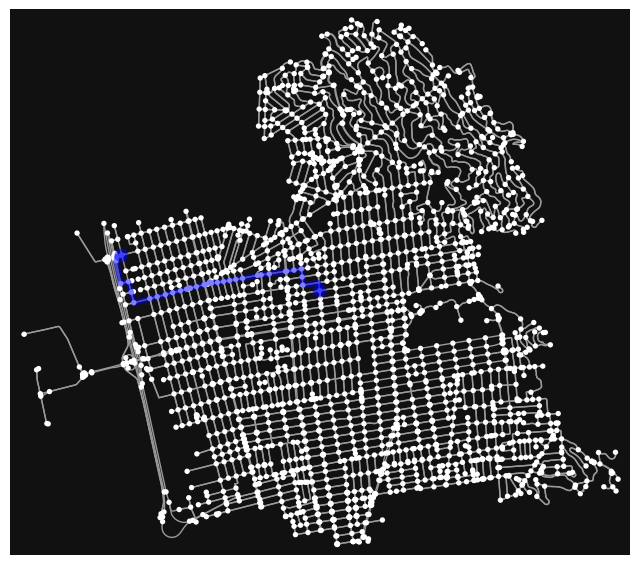

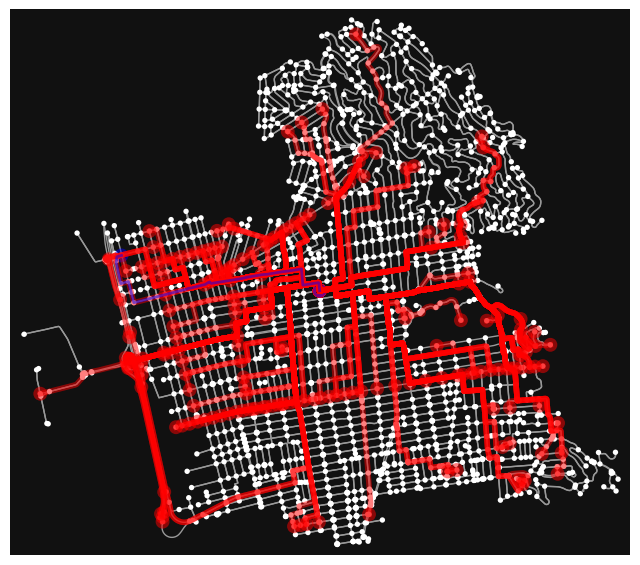

In [ ]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt

# Load the map graph from OpenStreetMap
place_name = "Berkeley, California"
map_graph = ox.graph_from_place(place_name, network_type='drive')

# Define start and end locations
origin_point = (37.8743, -122.277)
origin = ox.distance.nearest_nodes(map_graph, origin_point[1], origin_point[0])
destination = list(map_graph.nodes())[-1]  # Example: choose last node

# Define heuristic: straight-line (Euclidean) distance
def heuristic(u, v):
    lat1, lon1 = map_graph.nodes[u]['y'], map_graph.nodes[u]['x']
    lat2, lon2 = map_graph.nodes[v]['y'], map_graph.nodes[v]['x']
    return ox.distance.great_circle(lat1, lon1, lat2, lon2)


# A* Shortest Path
astar_path = nx.astar_path(map_graph, origin, destination, heuristic=heuristic, weight='length')

# Plot shortest path in blue
fig, ax = ox.plot_graph_route(map_graph, astar_path, route_color='blue', route_linewidth=4)

# (Optional) Plot *all* reachable paths from origin (pseudo-exploration)
# For visualization purposes only: get paths to nearby nodes
red_paths = []
for node in list(map_graph.nodes())[:200]:  # Limit for performance
    try:
        path = nx.astar_path(map_graph, origin, node, heuristic=heuristic, weight='length')
        red_paths.append(path)
    except:
        continue  # Not all nodes may be reachable

# Plot all explored red paths
fig, ax = ox.plot_graph_routes(map_graph, red_paths, route_colors='red', route_linewidth=0.5, show=False, close=False)
# Plot final shortest (blue) on top
fig, ax = ox.plot_graph_route(map_graph, astar_path, route_color='blue', route_linewidth=2, ax=ax)


# Adaptive Cruise Control

Errore >> 95
Errord >> 0
Errori >> 95
Vel >> 11.5368
acc >> 9.5368
dis >> 93.2316
Errore >> 88.2316
Errord >> -6.7684
Errori >> 183.23160000000001
Vel >> 13.65793056
acc >> 2.1211305600000006
dis >> 80.63423472
Errore >> 75.63423472
Errord >> -12.597365280000005
Errori >> 258.86583472
Vel >> 8.719340327551995
acc >> -4.938590232448005
dis >> 69.445599276224
Errore >> 64.445599276224
Errord >> -11.188635443775993
Errori >> 323.311433996224
Vel >> 4.099357780800361
acc >> -4.6199825467516344
dis >> 63.036250222047826
Errore >> 58.036250222047826
Errord >> -6.409349054176175
Errori >> 381.34768421827187
Vel >> 3.643713207847797
acc >> -0.4556445729525634
dis >> 59.16471472772375
Errore >> 54.16471472772375
Errord >> -3.8715354943240783
Errori >> 435.51239894599564
Vel >> 5.360667917949783
acc >> 1.7169547101019864
dis >> 54.66252416482496
Errore >> 49.66252416482496
Errord >> -4.5021905628987895
Errori >> 485.1749231108206
Vel >> 6.015583340027048
acc >> 0.6549154220772642
dis >> 48.97439

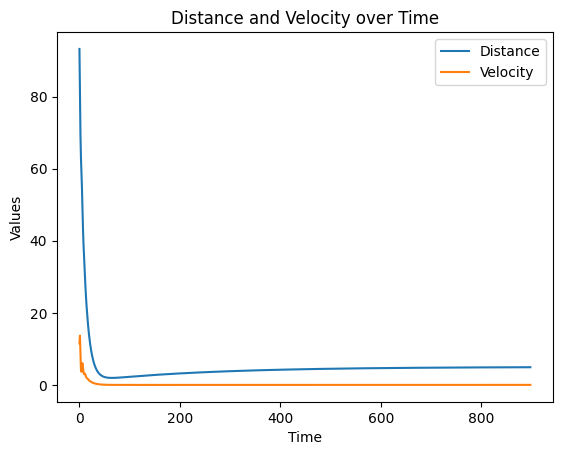

In [ ]:
import matplotlib.pyplot as plt

dmax = 5
kp = 100
ki = 0.4
kd = 1000
b = 0.6
m = 1000

vel = 2
a = 0
s = 100

e = s - dmax
i = 0
d = 0


e1 = s - dmax
earr = []
sarr = []
varr = []

while abs(e) > 0.1 or abs(e1) > 0.1:
    e = s - dmax
    i += e
    d = e - e1

    u = kp * e + kd * d + ki * i

    if e > 100 or e < -100:
        break

    e1 = e
    print("Errore >>", e)
    print("Errord >>", d)
    print("Errori >>", i)

    a = (u - b * vel) / m
    s -= vel + (a / 2)
    vel = vel + a
    print("Vel >>", vel)
    print("acc >>", a)
    print("dis >>", s)
    earr.append(e)
    sarr.append(s)
    varr.append(vel)

plt.plot(range(len(sarr)), sarr, label="Distance")
plt.plot(range(len(varr)), varr, label="Velocity")
plt.xlabel("Time")
plt.ylabel("Values")
plt.legend()
plt.title("Distance and Velocity over Time")
plt.show()



# PPT

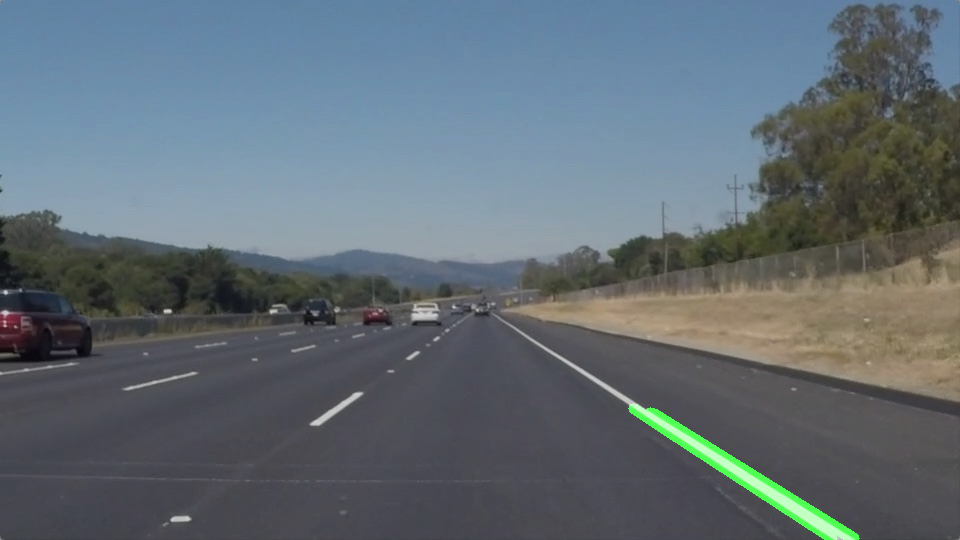

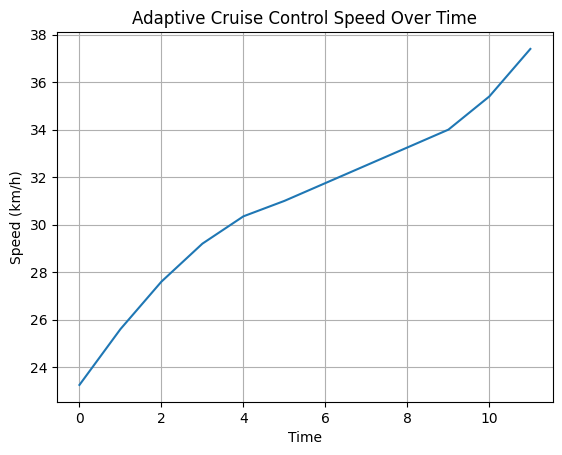

Edge GeoDataFrame columns: Index(['osmid', 'highway', 'lanes', 'maxspeed', 'name', 'oneway', 'reversed',
       'length', 'geometry', 'ref', 'access', 'width', 'bridge', 'junction'],
      dtype='object')
Total path length: 0.00 meters


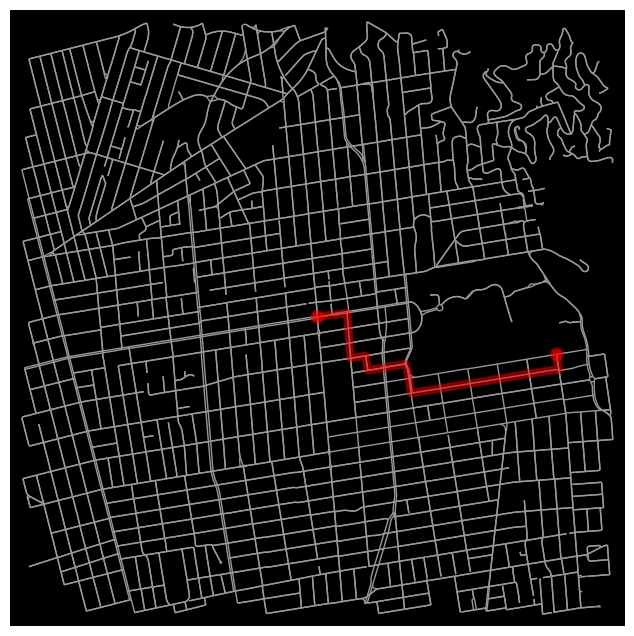

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox

# ========== Lane Detection ==========
def canny_edge_detector(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blur, 50, 150)
    return edges

def region_of_interest(image):
    height = image.shape[0]
    polygons = np.array([[(100, height), (1180, height), (600, 400)]])
    mask = np.zeros_like(image)
    cv2.fillPoly(mask, polygons, 255)
    masked_image = cv2.bitwise_and(image, mask)
    return masked_image

def hough_lines(image):
    return cv2.HoughLinesP(image, 1, np.pi / 180, 100, np.array([]), minLineLength=40, maxLineGap=5)

def display_lines(image, lines):
    line_image = np.zeros_like(image)
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 10)
    return line_image

def lane_detection_pipeline(image):
    edges = canny_edge_detector(image)
    roi = region_of_interest(edges)
    lines = hough_lines(roi)
    line_img = display_lines(image, lines)
    return cv2.addWeighted(image, 0.8, line_img, 1, 1)

# ========== Lane Departure Warning ==========
def lane_departure_warning(vehicle_center, lane_center, threshold=50):
    if abs(vehicle_center - lane_center) > threshold:
        print("Warning: Lane Departure Detected!")

# ========== Adaptive Cruise Control ==========
def adaptive_cruise_control(distances, target_distance=5.0):
    kp, ki, kd = 0.5, 0.05, 0.1
    vel, acc = 20, 0
    integral = 0
    prev_error = 0

    speeds = []
    time_steps = range(len(distances))

    for d in distances:
        error = d - target_distance
        integral += error
        derivative = error - prev_error
        acc = kp * error + ki * integral + kd * derivative
        vel += acc
        vel = max(0, vel)  # Ensure velocity stays non-negative
        speeds.append(vel)
        prev_error = error

    return time_steps, speeds

# ========== A* Pathfinding ==========
def shortest_path_astar(origin_point, destination_point):
    G = ox.graph_from_point(origin_point, dist=2000, network_type='drive')
    origin_node = ox.distance.nearest_nodes(G, origin_point[1], origin_point[0])
    destination_node = ox.distance.nearest_nodes(G, destination_point[1], destination_point[0])

    # Define the Euclidean distance heuristic
    def euclidean_distance(u, v):
        x1, y1 = G.nodes[u]['x'], G.nodes[u]['y']
        x2, y2 = G.nodes[v]['x'], G.nodes[v]['y']
        return ((x1 - x2)**2 + (y1 - y2)**2)**0.5

    # Find the A* path using the heuristic function
    path = nx.astar_path(G, origin_node, destination_node, heuristic=euclidean_distance, weight='length')

    # Convert the graph to GeoDataFrames
    gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

    # Print the column names of the edges GeoDataFrame
    print("Edge GeoDataFrame columns:", gdf_edges.columns)

    # Check column names and use the correct ones for the 'u' and 'v' nodes
    edge_lengths = []
    for i in range(len(path) - 1):
        u, v = path[i], path[i + 1]
        # Find the correct column names
        source_col, target_col = None, None
        for col in ['from', 'to', 'u', 'v']:  # these are common column names in OSMnx graphs
            if col in gdf_edges.columns:
                if source_col is None:
                    source_col = col
                elif target_col is None:
                    target_col = col

        if source_col and target_col:
            # Now we can filter edges based on the correct column names
            edge_data = gdf_edges[(gdf_edges[source_col] == u) & (gdf_edges[target_col] == v)]
            if not edge_data.empty:
                edge_lengths.append(edge_data['length'].values[0])

    # Calculate the total length of the path
    total_length = sum(edge_lengths)
    print(f"Total path length: {total_length:.2f} meters")

    # Plot the route
    ox.plot_graph_route(G, path, route_linewidth=6, node_size=0, bgcolor='k')







# ========== Example Execution ==========
if __name__ == "__main__":
    # Lane Detection
    from google.colab.patches import cv2_imshow
    image = cv2.imread("test_lane.jpg")  # Make sure you upload this image in Colab
    lane_result = lane_detection_pipeline(image)
    cv2_imshow(lane_result)

    # Lane Departure Warning
    lane_departure_warning(vehicle_center=600, lane_center=500)

    # Adaptive Cruise Control Simulation
    test_distances = [10, 9, 8, 7, 6, 5, 5, 5, 5, 5, 6, 7]
    time_arr, speed_arr = adaptive_cruise_control(test_distances)
    plt.plot(time_arr, speed_arr)
    plt.title("Adaptive Cruise Control Speed Over Time")
    plt.xlabel("Time")
    plt.ylabel("Speed (km/h)")
    plt.grid(True)
    plt.show()

    # A* Shortest Path
    origin = (37.8715, -122.2730)  # Example: Berkeley
    destination = (37.8691, -122.2545)  # Nearby Point
    shortest_path_astar(origin, destination)


In [ ]:
!wget -O test_lane.jpg https://github.com/udacity/CarND-LaneLines-P1/raw/master/test_images/solidWhiteRight.jpg

--2025-05-11 09:54:02--  https://github.com/udacity/CarND-LaneLines-P1/raw/master/test_images/solidWhiteRight.jpg
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/udacity/CarND-LaneLines-P1/master/test_images/solidWhiteRight.jpg [following]
--2025-05-11 09:54:02--  https://raw.githubusercontent.com/udacity/CarND-LaneLines-P1/master/test_images/solidWhiteRight.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 70682 (69K) [image/jpeg]
Saving to: ‘test_lane.jpg’

test_lane.jpg       100%[===================>]  69.03K  --.-KB/s    in 0.002s  

2025-05-11 09:54:02 (31.2 MB/s) - ‘test_lane.jpg’ s

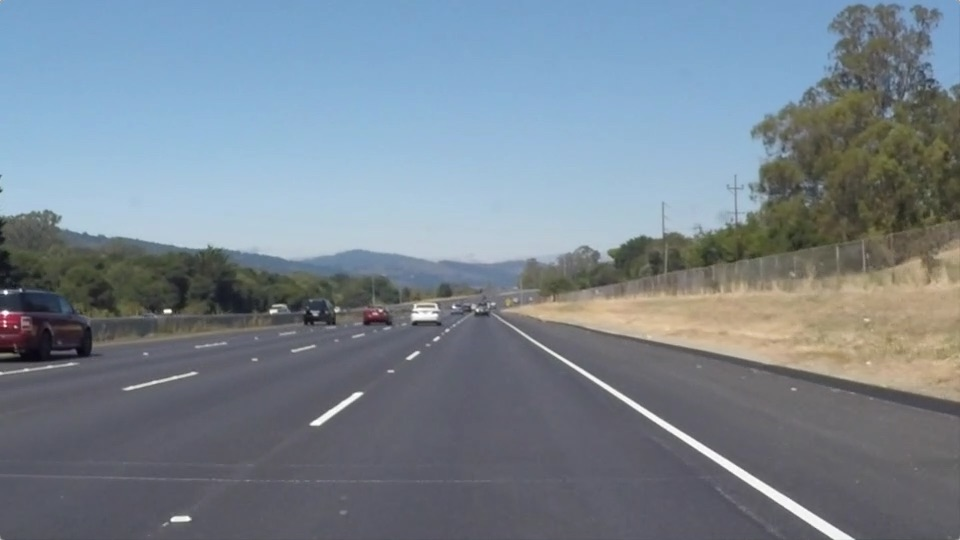

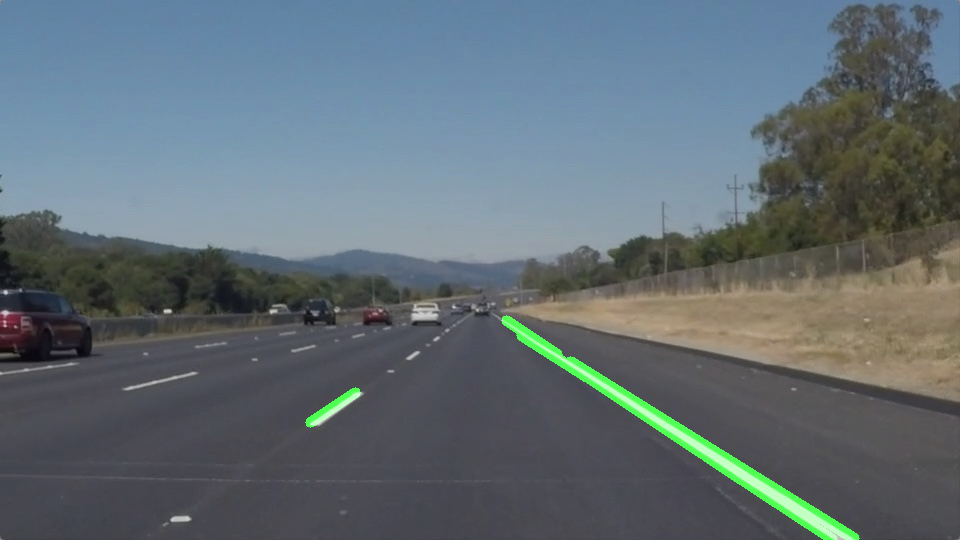

True

In [ ]:
# STEP 2: Lane Detection using OpenCV (LDW & LKA)

import cv2
import numpy as np
import matplotlib.pyplot as plt

from google.colab.patches import cv2_imshow  # For displaying images in Colab

def canny_edge(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    return cv2.Canny(blur, 50, 150)

def region_of_interest(img):
    height, width = img.shape[:2]
    polygon = np.array([
        [(0, height), (width, height), (width//2 + 50, height//2 + 50), (width//2 - 50, height//2 + 50)]
    ])
    mask = np.zeros_like(img)
    cv2.fillPoly(mask, polygon, 255)
    return cv2.bitwise_and(img, mask)

def display_lines(img, lines):
    line_image = np.zeros_like(img)
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line.reshape(4)
            cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 10)
    return line_image

def detect_lanes(img):
    canny = canny_edge(img)
    roi = region_of_interest(canny)
    lines = cv2.HoughLinesP(roi, 2, np.pi/180, 100, np.array([]), minLineLength=40, maxLineGap=5)
    line_img = display_lines(img, lines)
    combo = cv2.addWeighted(img, 0.8, line_img, 1, 1)
    return combo

# Process multiple frames
frame_dir = 'test_frames'
success_count = 0
total_frames = 100  # Change

# Upload an image or use sample
import cv2
from google.colab.patches import cv2_imshow

# Load the image
img = cv2.imread('test_lane.jpg')

# Display the image
cv2_imshow(img)

# Assuming you have a function named detect_lanes
lane_output = detect_lanes(img)

# Display the result
cv2_imshow(lane_output)
cv2.imwrite('lane_output.jpg', lane_output)



In [ ]:
# STEP 2: Lane Detection using OpenCV (LDW & LKA)

import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

from google.colab.patches import cv2_imshow  # For displaying images in Colab

def canny_edge(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    return cv2.Canny(blur, 50, 150)

def region_of_interest(img):
    height, width = img.shape[:2]
    polygon = np.array([
        [(0, height), (width, height), (width//2 + 50, height//2 + 50), (width//2 - 50, height//2 + 50)]
    ])
    mask = np.zeros_like(img)
    cv2.fillPoly(mask, polygon, 255)
    return cv2.bitwise_and(img, mask)

def display_lines(img, lines):
    line_image = np.zeros_like(img)
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line.reshape(4)
            cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 10)
    return line_image

def detect_lanes(img):
    canny = canny_edge(img)
    roi = region_of_interest(canny)
    lines = cv2.HoughLinesP(roi, 2, np.pi/180, 100, np.array([]), minLineLength=40, maxLineGap=5)
    line_img = display_lines(img, lines)
    combo = cv2.addWeighted(img, 0.8, line_img, 1, 1)
    return combo

import cv2
from google.colab.patches import cv2_imshow

# # Load the image
# img = cv2.imread('test_lane.jpg')

# # Display the image
# cv2_imshow(img)

# # Assuming you have a function named detect_lanes
# lane_output = detect_lanes(img)

# # Display the result
# cv2_imshow(lane_output)
# cv2.imwrite('lane_output.jpg', lane_output)


# Process multiple frames
frame_dir = 'test_frames'
success_count = 0
total_frames = 100  # Change as needed

for i in range(total_frames):
    frame_path = os.path.join(frame_dir, f'frame_{i}.jpg')
    img = cv2.imread(frame_path)

    if img is None:
        print(f"Frame {i} not found.")
        continue

    output, detected = detect_lanes(img)

    # Save or display the result
    # cv2_imshow(output)  # Uncomment if you want to show each frame
    output_path = os.path.join(frame_dir, f'lane_output_{i}.jpg')
    cv2.imwrite(output_path, output)

    if detected:
        success_count += 1

print(f"Lanes detected in {success_count} out of {total_frames} frames.")

Frame 0 not found.
Frame 1 not found.
Frame 2 not found.
Frame 3 not found.
Frame 4 not found.
Frame 5 not found.
Frame 6 not found.
Frame 7 not found.
Frame 8 not found.
Frame 9 not found.
Frame 10 not found.
Frame 11 not found.
Frame 12 not found.
Frame 13 not found.
Frame 14 not found.
Frame 15 not found.
Frame 16 not found.
Frame 17 not found.
Frame 18 not found.
Frame 19 not found.
Frame 20 not found.
Frame 21 not found.
Frame 22 not found.
Frame 23 not found.
Frame 24 not found.
Frame 25 not found.
Frame 26 not found.
Frame 27 not found.
Frame 28 not found.
Frame 29 not found.
Frame 30 not found.
Frame 31 not found.
Frame 32 not found.
Frame 33 not found.
Frame 34 not found.
Frame 35 not found.
Frame 36 not found.
Frame 37 not found.
Frame 38 not found.
Frame 39 not found.
Frame 40 not found.
Frame 41 not found.
Frame 42 not found.
Frame 43 not found.
Frame 44 not found.
Frame 45 not found.
Frame 46 not found.
Frame 47 not found.
Frame 48 not found.
Frame 49 not found.
Frame 50 n

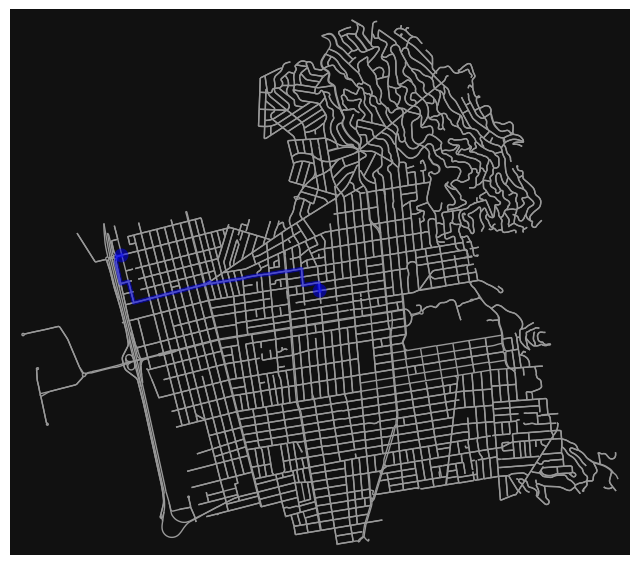

Total path length (meters): 3311.31


In [ ]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
from geopy.distance import geodesic

# Get graph
place = "Berkeley, California, USA"
graph = ox.graph_from_place(place, network_type='drive')

# Define origin & destination nodes
origin_point = (37.8743, -122.277)
origin = ox.distance.nearest_nodes(graph, origin_point[1], origin_point[0])
destination = list(graph.nodes())[-1]

# Heuristic using Haversine
def heuristic(u, v):
    lat1, lon1 = graph.nodes[u]['y'], graph.nodes[u]['x']
    lat2, lon2 = graph.nodes[v]['y'], graph.nodes[v]['x']
    return ox.distance.great_circle(lat1, lon1, lat2, lon2)

# A* path
path = nx.astar_path(graph, origin, destination, heuristic=heuristic, weight='length')

# Plot result
fig, ax = ox.plot_graph_route(graph, path, route_color='blue', route_linewidth=3, node_size=0)

# Calculate total path length manually using geopy for Haversine distance
total_length = 0
for i in range(len(path) - 1):
    u, v = path[i], path[i + 1]
    # Get the coordinates of the two nodes
    node_u = (graph.nodes[u]['y'], graph.nodes[u]['x'])
    node_v = (graph.nodes[v]['y'], graph.nodes[v]['x'])

    # Calculate the distance between the nodes (in meters)
    total_length += geodesic(node_u, node_v).meters

print(f"Total path length (meters): {total_length:.2f}")


# Test


In [ ]:
!wget -O test_lane1.jpg https://raw.githubusercontent.com/udacity/CarND-LaneLines-P1/master/test_images/solidWhiteCurve.jpg
!wget -O test_lane2.jpg https://raw.githubusercontent.com/udacity/CarND-LaneLines-P1/master/test_images/solidYellowCurve.jpg
!wget -O test_lane3.jpg https://raw.githubusercontent.com/udacity/CarND-LaneLines-P1/master/test_images/whiteCarLaneSwitch.jpg


--2025-05-14 08:49:17--  https://raw.githubusercontent.com/udacity/CarND-LaneLines-P1/master/test_images/solidWhiteCurve.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 50222 (49K) [image/jpeg]
Saving to: ‘test_lane1.jpg’

test_lane1.jpg      100%[===================>]  49.04K  --.-KB/s    in 0.009s  

2025-05-14 08:49:17 (5.55 MB/s) - ‘test_lane1.jpg’ saved [50222/50222]

--2025-05-14 08:49:17--  https://raw.githubusercontent.com/udacity/CarND-LaneLines-P1/master/test_images/solidYellowCurve.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response.

Displaying test_lane1.jpg


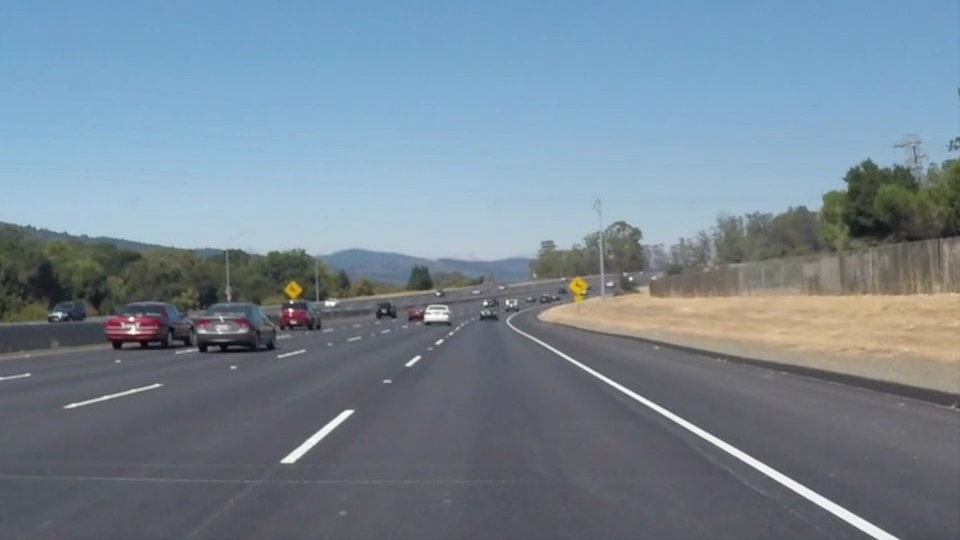

Lane detection result for test_lane1.jpg


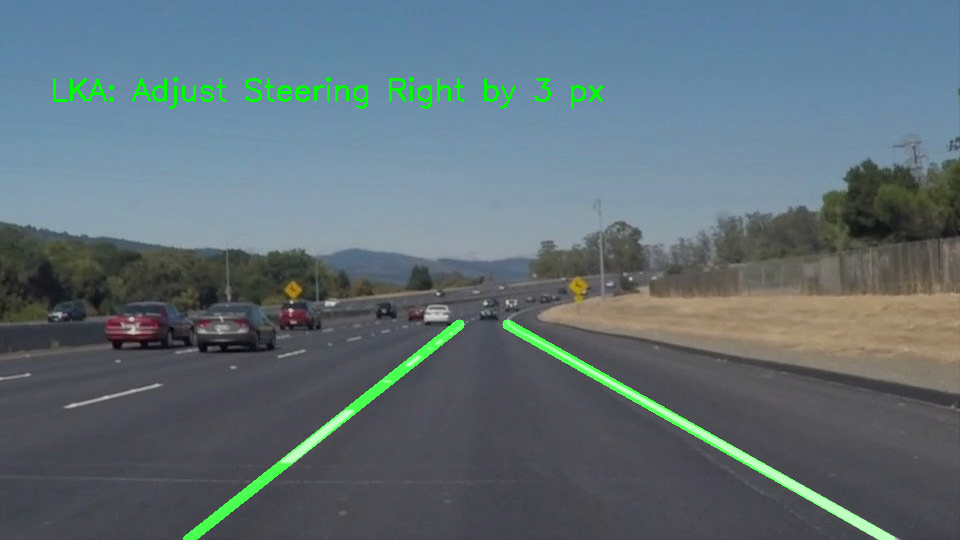

Saved result to lane_output_1.jpg
Displaying test_lane2.jpg


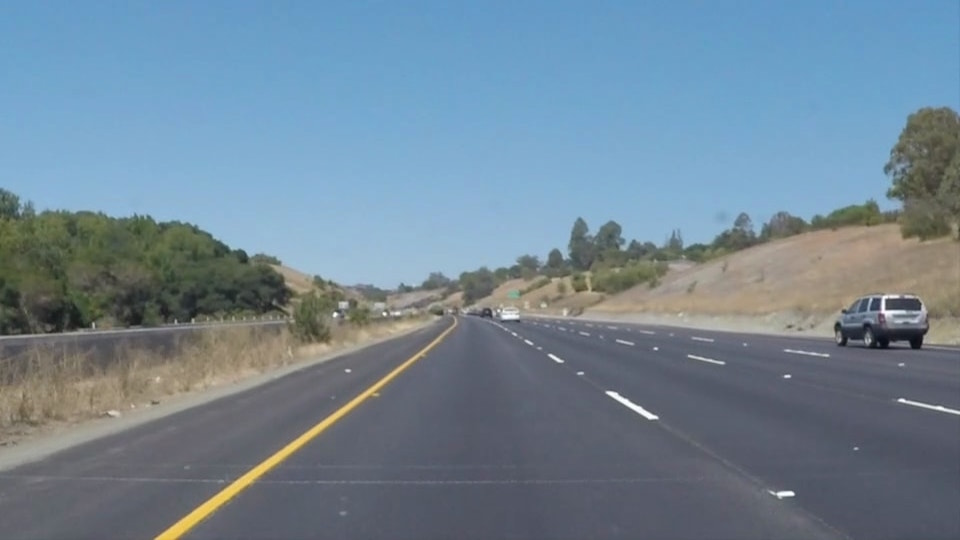

Lane detection result for test_lane2.jpg


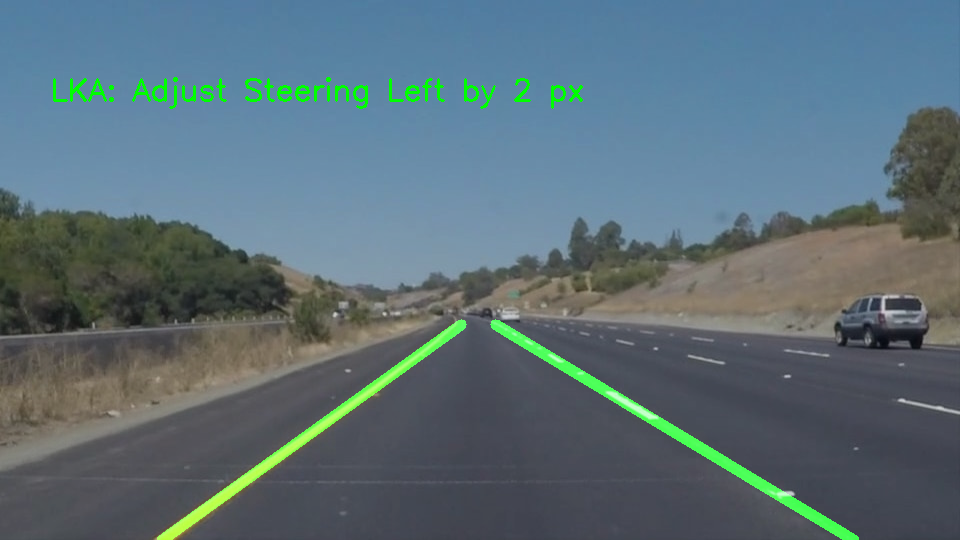

Saved result to lane_output_2.jpg
Displaying test_lane3.jpg


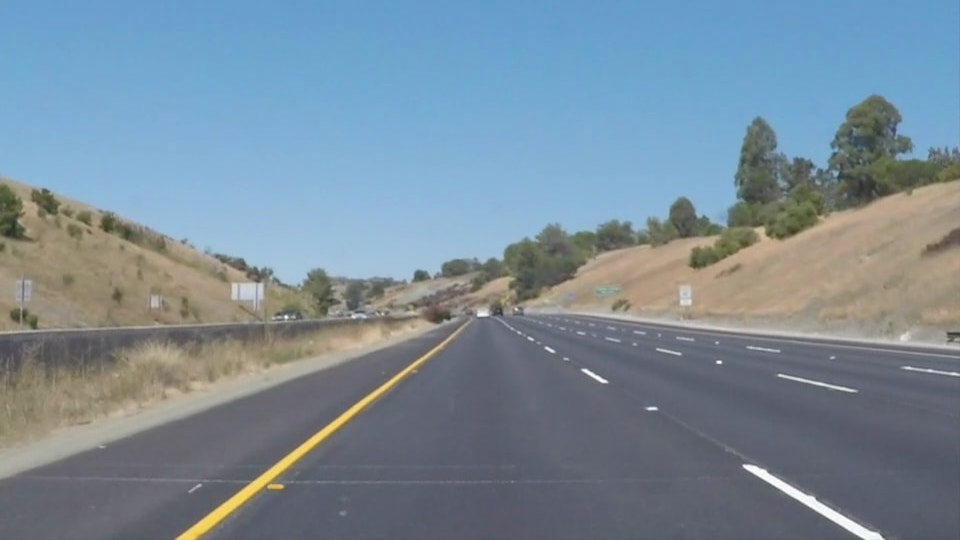

Lane detection result for test_lane3.jpg


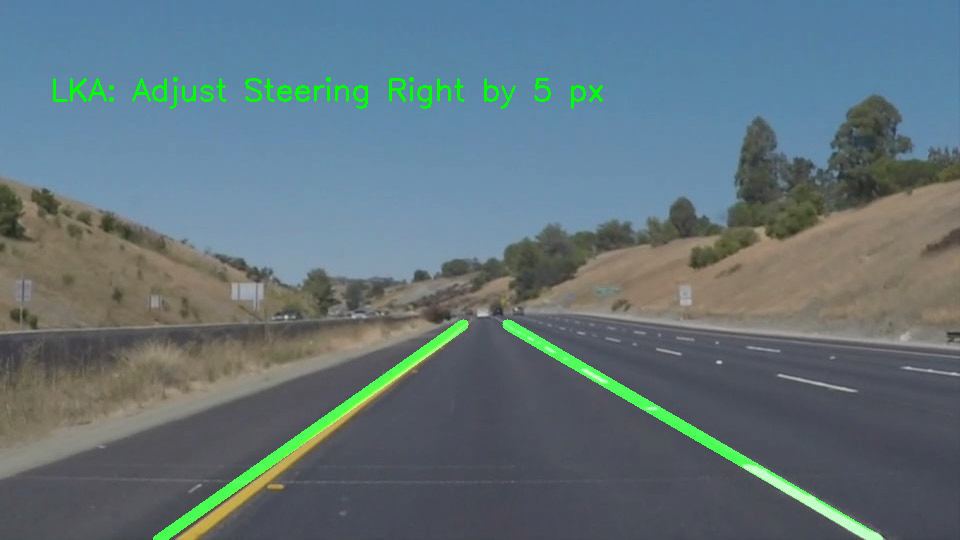

Saved result to lane_output_3.jpg


In [ ]:
# STEP 2: Lane Detection using OpenCV (LDW & LKA)

import cv2
import numpy as np
import matplotlib.pyplot as plt

from google.colab.patches import cv2_imshow  # For displaying images in Colab

def canny_edge(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    return cv2.Canny(blur, 50, 150)

def region_of_interest(img):
    height, width = img.shape[:2]
    polygon = np.array([
        [(0, height), (width, height), (width//2 + 50, height//2 + 50), (width//2 - 50, height//2 + 50)]
    ])
    mask = np.zeros_like(img)
    cv2.fillPoly(mask, polygon, 255)
    return cv2.bitwise_and(img, mask)

def make_coordinates(image, line_parameters):
    slope, intercept = line_parameters
    y1 = image.shape[0]
    y2 = int(y1 * 0.6)  # line height
    x1 = int((y1 - intercept) / slope)
    x2 = int((y2 - intercept) / slope)
    return np.array([x1, y1, x2, y2])

def average_slope_intercept(image, lines):
    left_lines = []
    right_lines = []
    if lines is None:
        return None
    for line in lines:
        x1, y1, x2, y2 = line.reshape(4)
        params = np.polyfit((x1, x2), (y1, y2), 1)  # slope and intercept
        slope, intercept = params
        if slope < 0:
            left_lines.append((slope, intercept))
        else:
            right_lines.append((slope, intercept))
    left_avg = np.mean(left_lines, axis=0) if left_lines else None
    right_avg = np.mean(right_lines, axis=0) if right_lines else None
    lines = []
    if left_avg is not None:
        lines.append(make_coordinates(image, left_avg))
    if right_avg is not None:
        lines.append(make_coordinates(image, right_avg))
    return np.array(lines)


# updated code

def display_lines(image, lines):
    line_image = np.zeros_like(image)
    if lines is not None:
        for line in lines:
            if (
                line is not None and
                isinstance(line, (list, np.ndarray)) and
                len(line) == 4 and
                all(isinstance(x, (int, float, np.integer, np.floating)) for x in line)
            ):
                x1, y1, x2, y2 = map(int, line)
                cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 10)
    return line_image


def average_slope_intercept(image, lines):
    left_fit = []
    right_fit = []

    if lines is None:
        return None, True  # LDW triggered: no lines detected

    for line in lines:
        x1, y1, x2, y2 = line.reshape(4)
        parameters = np.polyfit((x1, x2), (y1, y2), 1)  # fit = [slope, intercept]
        slope, intercept = parameters
        if slope < 0:
            left_fit.append((slope, intercept))
        else:
            right_fit.append((slope, intercept))

    left_line, right_line = None, None
    h = image.shape[0]

    ldw_trigger = False

    if left_fit:
        left_avg = np.mean(left_fit, axis=0)
        left_line = make_coordinates(image, left_avg)

    else:
        ldw_trigger = True  # Left lane missing

    if right_fit:
        right_avg = np.mean(right_fit, axis=0)
        right_line = make_coordinates(image, right_avg)
    else:
        ldw_trigger = True  # Right lane missing

    return np.array([left_line, right_line]), ldw_trigger


def compute_steering(image, lines):
    if lines is None or lines[0] is None or lines[1] is None:
        return None  # Cannot compute steering

    left_x2 = lines[0][2]
    right_x2 = lines[1][2]

    lane_center = (left_x2 + right_x2) // 2
    frame_center = image.shape[1] // 2

    offset = lane_center - frame_center
    return offset  # Can be +ve (right), -ve (left)


def detect_lanes(image):
    canny = canny_edge(image)
    roi = region_of_interest(canny)
    lines = cv2.HoughLinesP(roi, 2, np.pi/180, 100, np.array([]), minLineLength=40, maxLineGap=5)

    averaged_lines, ldw_warning = average_slope_intercept(image, lines)
    line_image = display_lines(image, averaged_lines)

    # Lane Keeping Assist
    steering_offset = compute_steering(image, averaged_lines)

    # Overlay lines on original image
    output = cv2.addWeighted(image, 0.8, line_image, 1, 1)

    # Annotate warnings
    if ldw_warning:
        cv2.putText(output, "LDW: Lane Departure Warning!", (50, 50),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    if steering_offset is not None:
        direction = "Left" if steering_offset < 0 else "Right"
        cv2.putText(output, f"LKA: Adjust Steering {direction} by {abs(steering_offset)} px",
                    (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

    return output


import cv2
from google.colab.patches import cv2_imshow  # Only needed in Google Colab

# Load images into a vector (list)
images = [
    cv2.imread('test_lane1.jpg'),
    cv2.imread('test_lane2.jpg'),
    cv2.imread('test_lane3.jpg')
]

# Process each image
for idx, img in enumerate(images):
    if img is None:
        print(f"Image {idx+1} failed to load.")
        continue

    # Display original image
    print(f"Displaying test_lane{idx+1}.jpg")
    cv2_imshow(img)

    # Detect lanes (assumes this function is already defined)
    lane_output = detect_lanes(img)

    # Display result
    print(f"Lane detection result for test_lane{idx+1}.jpg")
    cv2_imshow(lane_output)

    # Save output
    output_filename = f'lane_output_{idx+1}.jpg'
    cv2.imwrite(output_filename, lane_output)
    print(f"Saved result to {output_filename}")



# IMages and video


In [ ]:
# STEP 1: Download the test images from GitHub
!git clone https://github.com/ashokumar06/Road-lane-line-detection.git
!mkdir -p test_frames
!cp Road-lane-line-detection/data/test_images/* test_frames/


Cloning into 'Road-lane-line-detection'...
remote: Enumerating objects: 1388, done.
remote: Counting objects: 100% (97/97), done.
remote: Compressing objects: 100% (71/71), done.
remote: Total 1388 (delta 28), reused 89 (delta 26), pack-reused 1291 (from 1)
Receiving objects: 100% (1388/1388), 645.25 MiB | 16.95 MiB/s, done.
Resolving deltas: 100% (386/386), done.
Updating files: 100% (1369/1369), done.


Displaying test_lane1.jpg


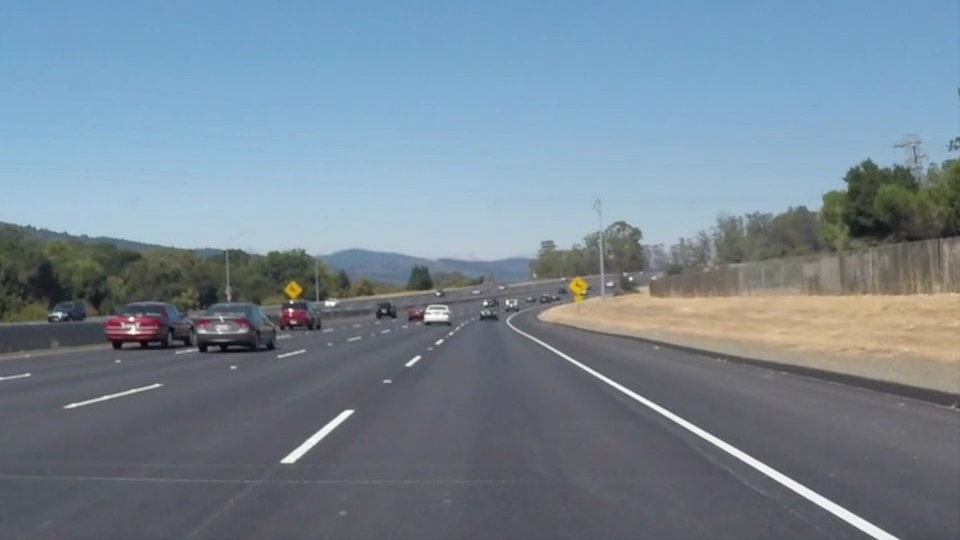

Lane detection result for test_lane1.jpg


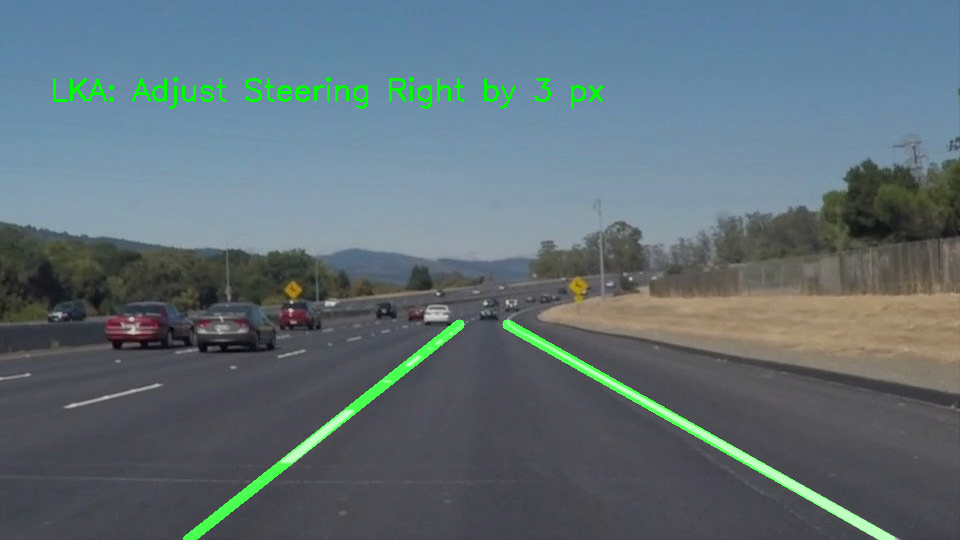

Saved result to lane_output_1.jpg
Displaying test_lane2.jpg


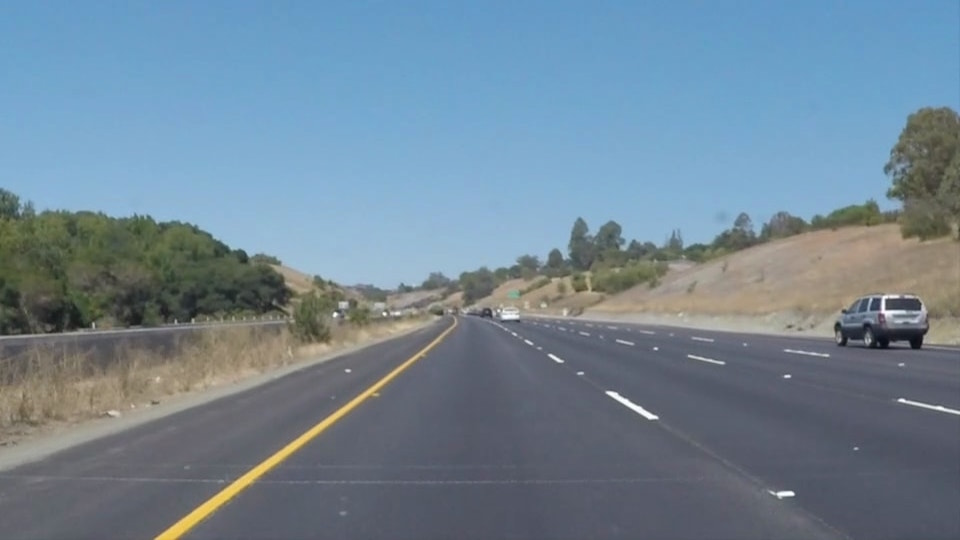

Lane detection result for test_lane2.jpg


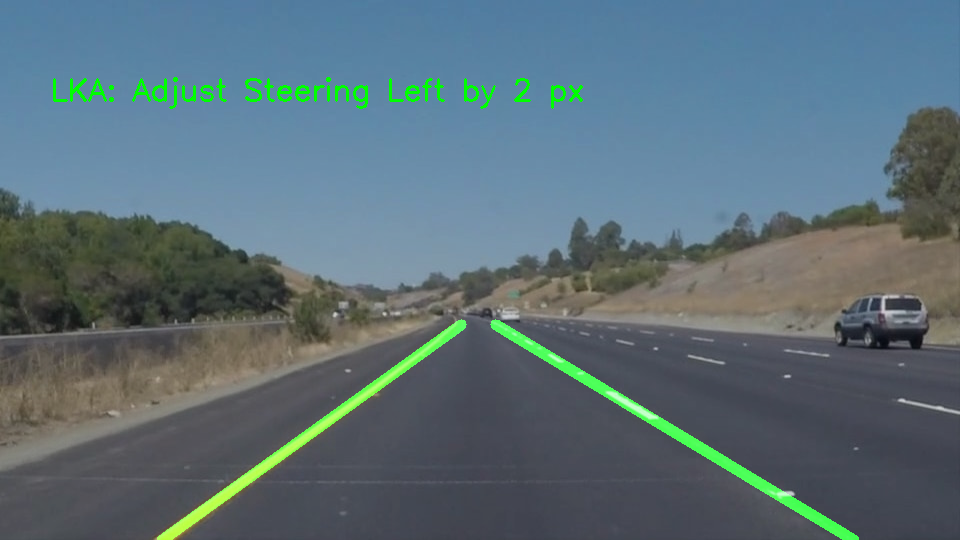

Saved result to lane_output_2.jpg
Displaying test_lane3.jpg


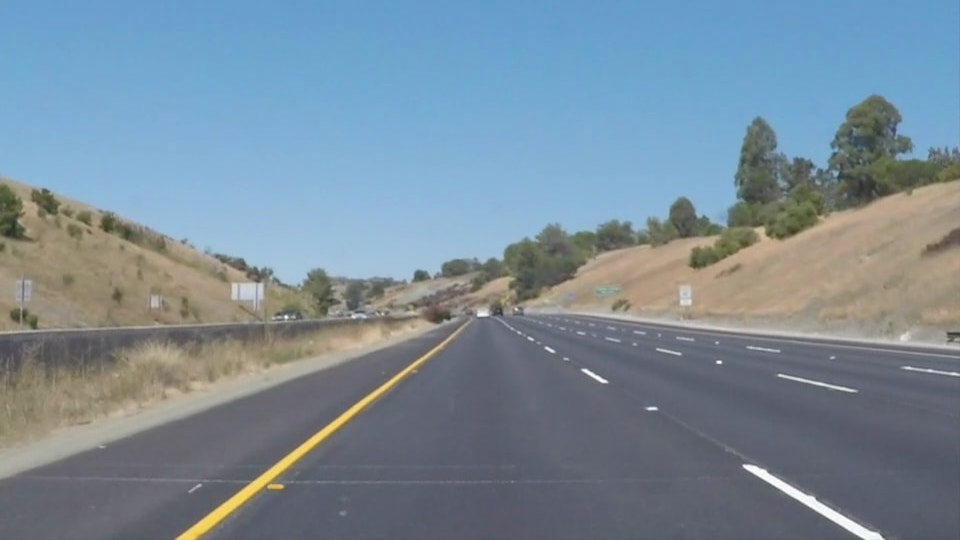

Lane detection result for test_lane3.jpg


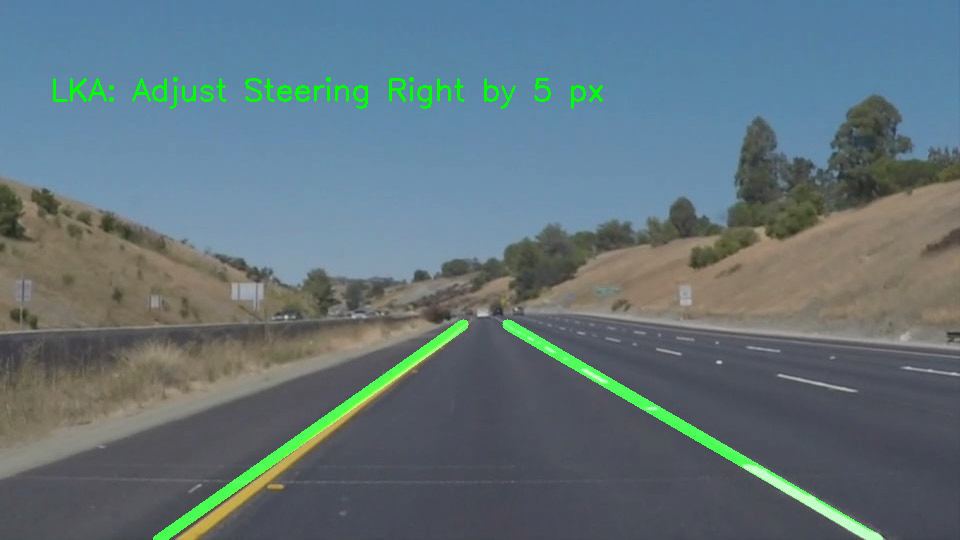

Saved result to lane_output_3.jpg


In [ ]:
# STEP 2: Lane Detection using OpenCV (LDW & LKA)

import cv2
import numpy as np
import matplotlib.pyplot as plt

from google.colab.patches import cv2_imshow  # For displaying images in Colab

def canny_edge(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    return cv2.Canny(blur, 50, 150)

def region_of_interest(img):
    height, width = img.shape[:2]
    polygon = np.array([
        [(0, height), (width, height), (width//2 + 50, height//2 + 50), (width//2 - 50, height//2 + 50)]
    ])
    mask = np.zeros_like(img)
    cv2.fillPoly(mask, polygon, 255)
    return cv2.bitwise_and(img, mask)

def make_coordinates(image, line_parameters):
    slope, intercept = line_parameters
    y1 = image.shape[0]
    y2 = int(y1 * 0.6)  # line height
    x1 = int((y1 - intercept) / slope)
    x2 = int((y2 - intercept) / slope)
    return np.array([x1, y1, x2, y2])

def average_slope_intercept(image, lines):
    left_lines = []
    right_lines = []
    if lines is None:
        return None
    for line in lines:
        x1, y1, x2, y2 = line.reshape(4)
        params = np.polyfit((x1, x2), (y1, y2), 1)  # slope and intercept
        slope, intercept = params
        if slope < 0:
            left_lines.append((slope, intercept))
        else:
            right_lines.append((slope, intercept))
    left_avg = np.mean(left_lines, axis=0) if left_lines else None
    right_avg = np.mean(right_lines, axis=0) if right_lines else None
    lines = []
    if left_avg is not None:
        lines.append(make_coordinates(image, left_avg))
    if right_avg is not None:
        lines.append(make_coordinates(image, right_avg))
    return np.array(lines)

def display_lines(image, lines):
    line_image = np.zeros_like(image)

    if lines is not None:
        for i, line in enumerate(lines):
            try:
                if line is None:
                    continue

                # Flatten and convert to list
                line = np.array(line).flatten().tolist()

                if len(line) != 4:
                    print(f"Skipping malformed line {i}: {line}")
                    continue

                # Unpack and force integers
                x1, y1, x2, y2 = [int(v) for v in line]

                cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 10)

            except Exception as e:
                print(f"Error drawing line {i}: {line} — {e}")

    return line_image




def average_slope_intercept(image, lines):
    left_fit = []
    right_fit = []

    if lines is None:
        return None, True  # LDW triggered: no lines detected

    for line in lines:
        x1, y1, x2, y2 = line.reshape(4)
        parameters = np.polyfit((x1, x2), (y1, y2), 1)  # fit = [slope, intercept]
        slope, intercept = parameters
        if slope < 0:
            left_fit.append((slope, intercept))
        else:
            right_fit.append((slope, intercept))

    left_line, right_line = None, None
    h = image.shape[0]

    ldw_trigger = False

    if left_fit:
        left_avg = np.mean(left_fit, axis=0)
        left_line = make_coordinates(image, left_avg)

    else:
        ldw_trigger = True  # Left lane missing

    if right_fit:
        right_avg = np.mean(right_fit, axis=0)
        right_line = make_coordinates(image, right_avg)
    else:
        ldw_trigger = True  # Right lane missing

    return [left_line, right_line], ldw_trigger


def compute_steering(image, lines):
    if lines is None or lines[0] is None or lines[1] is None:
        return None  # Cannot compute steering

    left_x2 = lines[0][2]
    right_x2 = lines[1][2]

    lane_center = (left_x2 + right_x2) // 2
    frame_center = image.shape[1] // 2

    offset = lane_center - frame_center
    return offset  # Can be +ve (right), -ve (left)


def detect_lanes(image):
    canny = canny_edge(image)
    roi = region_of_interest(canny)
    lines = cv2.HoughLinesP(roi, 2, np.pi/180, 100, np.array([]), minLineLength=40, maxLineGap=5)

    averaged_lines, ldw_warning = average_slope_intercept(image, lines)
    line_image = display_lines(image, averaged_lines)

    # Lane Keeping Assist
    steering_offset = compute_steering(image, averaged_lines)

    # Overlay lines on original image
    output = cv2.addWeighted(image, 0.8, line_image, 1, 1)

    # Annotate warnings
    if ldw_warning:
        cv2.putText(output, "LDW: Lane Departure Warning!", (50, 50),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    if steering_offset is not None:
        direction = "Left" if steering_offset < 0 else "Right"
        cv2.putText(output, f"LKA: Adjust Steering {direction} by {abs(steering_offset)} px",
                    (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

    return output


import cv2
from google.colab.patches import cv2_imshow  # Only needed in Google Colab

# Load images into a vector (list)
images = [
    cv2.imread('test_lane1.jpg'),
    cv2.imread('test_lane2.jpg'),
    cv2.imread('test_lane3.jpg')
]

# Process each image
for idx, img in enumerate(images):
    if img is None:
        print(f"Image {idx+1} failed to load.")
        continue

    # Display original image
    print(f"Displaying test_lane{idx+1}.jpg")
    cv2_imshow(img)

    # Detect lanes (assumes this function is already defined)
    lane_output = detect_lanes(img)

    # Display result
    print(f"Lane detection result for test_lane{idx+1}.jpg")
    cv2_imshow(lane_output)

    # Save output
    output_filename = f'lane_output_{idx+1}.jpg'
    cv2.imwrite(output_filename, lane_output)
    print(f"Saved result to {output_filename}")



In [ ]:
import os

success_count = 0
total_frames = 0

# Path to the test images
test_dir = "test_frames"
image_files = sorted(os.listdir(test_dir))[:100]  # first 100 images (if more exist)

for i, filename in enumerate(image_files):
    filepath = os.path.join(test_dir, filename)
    frame = cv2.imread(filepath)

    if frame is None:
        print(f"Frame {i} failed to load.")
        continue

    print(f"Processing Frame {i+1}: {filename}")

    output = detect_lanes(frame)
    cv2_imshow(output)

    # Save output image
    cv2.imwrite(f'output_frame_{i}.jpg', output)

    # Evaluate detection
    canny = canny_edge(frame)
    roi = region_of_interest(canny)
    lines = cv2.HoughLinesP(roi, 2, np.pi/180, 100, np.array([]), minLineLength=40, maxLineGap=5)
    if lines is not None:
        success_count += 1
    total_frames += 1

accuracy = (success_count / total_frames) * 100
print(f"\n✅ Detected valid lane lines in {success_count}/{total_frames} images → Accuracy = {accuracy:.2f}%")


# Better Results

In [ ]:
# STEP 2: Lane Detection using OpenCV (LDW & LKA)

import cv2
import numpy as np
import matplotlib.pyplot as plt

from google.colab.patches import cv2_imshow  # For displaying images in Colab

def canny_edge(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Adaptive histogram equalization
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    gray = clahe.apply(gray)

    blur = cv2.GaussianBlur(gray, (7, 7), 0)  # More aggressive blur
    edges = cv2.Canny(blur, 40, 120)  # Adjusted thresholds
    return edges


def region_of_interest(image):
    height, width = image.shape[:2]

    # Define a polygon covering more realistic road area
    polygon = np.array([[
        (int(0.1 * width), height),
        (int(0.9 * width), height),
        (int(0.55 * width), int(0.6 * height)),
        (int(0.45 * width), int(0.6 * height))
    ]])

    mask = np.zeros_like(image)
    cv2.fillPoly(mask, [polygon], 255)
    return cv2.bitwise_and(image, mask)



def make_coordinates(image, line_parameters):
    slope, intercept = line_parameters
    y1 = image.shape[0]
    y2 = int(y1 * 0.6)  # line height
    x1 = int((y1 - intercept) / slope)
    x2 = int((y2 - intercept) / slope)
    return np.array([x1, y1, x2, y2])

def average_slope_intercept(image, lines):
    left_fit = []
    right_fit = []

    if lines is None:
        return None, True

    for line in lines:
        x1, y1, x2, y2 = line.reshape(4)
        if x2 - x1 == 0:  # avoid division by zero
            continue
        slope = (y2 - y1) / (x2 - x1)
        intercept = y1 - slope * x1

        # Filter out nearly horizontal/vertical lines
        if abs(slope) < 0.3 or abs(slope) > 2:
            continue

        if slope < 0:
            left_fit.append((slope, intercept))
        else:
            right_fit.append((slope, intercept))

    ldw_trigger = False
    left_line, right_line = None, None

    if left_fit:
        left_avg = np.mean(left_fit, axis=0)
        left_line = make_coordinates(image, left_avg)
    else:
        ldw_trigger = True

    if right_fit:
        right_avg = np.mean(right_fit, axis=0)
        right_line = make_coordinates(image, right_avg)
    else:
        ldw_trigger = True

    return [left_line, right_line], ldw_trigger


def display_lines(image, lines):
    line_image = np.zeros_like(image)

    if lines is not None:
        for i, line in enumerate(lines):
            try:
                if line is None or any(val is None for val in line):
                    continue

                # Flatten and convert to integers safely
                line = np.array(line).flatten()

                if len(line) != 4:
                    print(f"Skipping malformed line {i}: {line}")
                    continue

                x1, y1, x2, y2 = map(int, line)

                cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 10)

            except Exception as e:
                print(f"Error drawing line {i}: {line} — {e}")

    return line_image



def average_slope_intercept(image, lines):
    left_fit = []
    right_fit = []

    if lines is None:
        return []

    for line in lines:
        for x1, y1, x2, y2 in line:
            if x2 - x1 == 0:
                continue  # avoid division by zero
            slope = (y2 - y1) / (x2 - x1)
            intercept = y1 - slope * x1

            if slope < 0:
                left_fit.append((slope, intercept))
            else:
                right_fit.append((slope, intercept))

    averaged_lines = []
    height, width, _ = image.shape

    def make_line(slope, intercept):
      height, width, _ = image.shape
      y1 = height
      y2 = int(height * 0.6)

      # Add slope threshold to avoid division by zero
      if abs(slope) < 1e-3:
          return None  # Skip near-horizontal lines

      try:
          x1 = int((y1 - intercept) / slope)
          x2 = int((y2 - intercept) / slope)
          return [x1, y1, x2, y2]
      except Exception as e:
          print(f" Error computing line: {e}")
          return None


    if left_fit:
      left_avg = np.average(left_fit, axis=0)
      left_line = make_line(*left_avg)
      if left_line:
          averaged_lines.append(left_line)

    if right_fit:
      right_avg = np.average(right_fit, axis=0)
      right_line = make_line(*right_avg)
      if right_line:
          averaged_lines.append(right_line)





def compute_steering(image, lines):
    if lines is None or lines[0] is None or lines[1] is None:
        return None  # Cannot compute steering

    left_x2 = lines[0][2]
    right_x2 = lines[1][2]

    lane_center = (left_x2 + right_x2) // 2
    frame_center = image.shape[1] // 2

    offset = lane_center - frame_center
    return offset  # Can be +ve (right), -ve (left)


def detect_lanes(frame):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)

    # Step 2: Tune Canny Edge Detection here
    edges = cv2.Canny(blur, 70, 150)  # <-- REPLACE WITH TUNED VALUES

    # Step 3: Apply improved ROI
    cropped_edges = region_of_interest(edges)

    # Step 3: Use tuned Hough Transform here
    lines = cv2.HoughLinesP(
        cropped_edges,
        rho=1,
        theta=np.pi / 180,
        threshold=80,         # <- TUNED
        minLineLength=60,     # <- TUNED
        maxLineGap=40         # <- TUNED
    )

    averaged_lines = average_slope_intercept(frame, lines)
    line_image = display_lines(frame, averaged_lines)

    combo_image = cv2.addWeighted(frame, 0.8, line_image, 1, 1)
    return combo_image



In [ ]:
import os

success_count = 0
total_frames = 0

# Path to the test images
test_dir = "test_frames"
image_files = sorted(os.listdir(test_dir))[:100]  # first 100 images (if more exist)

for i, filename in enumerate(image_files):
    filepath = os.path.join(test_dir, filename)
    frame = cv2.imread(filepath)

    if frame is None:
        print(f"Frame {i} failed to load.")
        continue

    print(f"Processing Frame {i+1}: {filename}")

    output = detect_lanes(frame)
    cv2_imshow(output)

    # Save output image
    cv2.imwrite(f'output_frame_{i}.jpg', output)

    # Evaluate detection
    canny = canny_edge(frame)
    roi = region_of_interest(canny)
    lines = cv2.HoughLinesP(roi, 2, np.pi/180, 100, np.array([]), minLineLength=40, maxLineGap=5)
    if lines is not None and len(lines) >= 2:
      success_count += 1

    total_frames += 1

accuracy = (success_count / total_frames) * 100
print(f"\n✅ Detected valid lane lines in {success_count}/{total_frames} images → Accuracy = {accuracy:.2f}%")
